# Development of a House Price Prediction Model

### Importation of Necessary Libaries

In [3]:
# -- imports pandas library for working with Dataframe
import pandas as pd

# -- import numpy library for working with arrays
import numpy as np

# -- imports seaborn library
import seaborn as sns

# -- imports matplotlib library to assist in visualization
import matplotlib.pyplot as plt

# -- imports Z-Score Library for detecting Outliers
from scipy.stats import zscore

# -- imports the boxcox library for handling outliers
from scipy.stats import boxcox

# -- imports the ordinal encoder library
from sklearn.preprocessing import OrdinalEncoder

# -- imports the label encoder library
from sklearn.preprocessing import LabelEncoder

# -- imports train-test-split and Grid Search library for splitting the dataset(s)
from sklearn.model_selection import train_test_split,  GridSearchCV

# -- imports library for feature scaling
from sklearn.preprocessing import StandardScaler

# -- imports the regression models
from sklearn.linear_model import LinearRegression, Ridge, Lasso

# -- imports evaluation metric from sklear
from sklearn.metrics import mean_squared_error, r2_score

#-- imports joblib for model saving
import joblib

### Reads the CSV File(s) into a Dataframe

"To ensure proper randomization and avoid potential issues during data splitting, I first combined the initial training and testing datasets into a single datas..""


In [5]:
df = pd.read_csv("dataset.csv") # reads the train dataset into the "train_df" variable


### Exploratory Data Analysis (EDA)

In [7]:
df.head() # displays first 5 rows of the dataframe


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


In [8]:
# displays out the shape of the data

print(df.shape)

(2919, 81)


#### Describing the Data Using Statistical Terms (i.e Summary Statistics)

- Count: The number of observations or data points in each feature column.
- Mean: The average value of the observations in each feature column.
- Max: The highest value observed in each feature column.
- Standard Deviation: A measure of how spread out the observations are from the mean.
- 25th Percentile: The value below which 25% of the data falls.
- 50th Percentile / Median: The middle value, with 50% of data below and 50% above.
- 75th Percentile: The value below which 75% of the data falls.

Note: describe only works for numerical datatype columns 

In [10]:
df.describe() # describes the data

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,2919.000000,2919.000000,2433.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2896.000000,2918.000000,...,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000
mean,1460.000000,57.137718,69.305795,10168.114080,6.089072,5.564577,1971.312778,1984.264474,102.201312,441.423235,...,93.709832,47.486811,23.098321,2.602261,16.062350,2.251799,50.825968,6.213087,2007.792737,180052.854648
std,842.787043,42.517628,23.344905,7886.996359,1.409947,1.113131,30.291442,20.894344,179.334253,455.610826,...,126.526589,67.575493,64.244246,25.188169,56.184365,35.663946,567.402211,2.714762,1.314964,57381.565721
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,730.500000,20.000000,59.000000,7478.000000,5.000000,5.000000,1953.500000,1965.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,154795.084150
50%,1460.000000,50.000000,68.000000,9453.000000,6.000000,5.000000,1973.000000,1993.000000,0.000000,368.500000,...,0.000000,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,176734.841500
75%,2189.500000,70.000000,80.000000,11570.000000,7.000000,6.000000,2001.000000,2004.000000,164.000000,733.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,191895.744150
max,2919.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000,755000.000000


#### Summarizing the Dataframe's Structure

- Provides a concise summary of the DataFrame.
- Displays the total number of rows (entries) which could help in detecting missing values.
- Shows the number of non-null values in each column.
- Lists the data types of each column (e.g., int64, float64, object for categorical data).
- Gives the memory usage of the DataFrame.



In [12]:
df.info() # displays the summary of the dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   int64  
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2915 non-null   object 
 3   LotFrontage    2433 non-null   float64
 4   LotArea        2919 non-null   int64  
 5   Street         2919 non-null   object 
 6   Alley          198 non-null    object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2917 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallC

##### Observation:


"After reviewing the summaries of the train and test DataFrames, it was noted that certain columns contained missing value."



### Checking for Missing Values

In [15]:
missing_col_lst = df.columns[df.isnull().any()].tolist() # checks all columns in the dataframe for missing values and stores the column name in a list.

print(f"""
List of Columns in the Dataframe with Missing Values: 

{missing_col_lst}

Number of Columns in the Dataframe with Missing Values:

{len(missing_col_lst)}

""") # prints the list and number of all columns that have missing values.




List of Columns in the Dataframe with Missing Values: 

['MSZoning', 'LotFrontage', 'Alley', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Electrical', 'BsmtFullBath', 'BsmtHalfBath', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType']

Number of Columns in the Dataframe with Missing Values:

34




### Handling Missing Values 
Missing values are addressed by using the mean or median for numerical columns (`int64` or `float64`), and the mode for categorical columns.

In [17]:
missing_col_lst = df.columns[df.isnull().any()] # identifies columns with missing values

for missing_col in missing_col_lst:

    # handles missing values for categorical (i.e dtype "object") columns
    if df[missing_col].dtype == 'object': 
        mode_value = df[missing_col].mode()[0]  # uses the mode of the missing column to fill the missing values
        df[missing_col].fillna(mode_value, inplace=True)

    # handles missing values for numerical (i.e dtype "int64, float64") columns
    else: 
        mean_value = df[missing_col].mean() # uses the mean of the column to replace missing values
        df[missing_col].fillna(mean_value, inplace=True)

C:\Users\hp\AppData\Local\Temp\ipykernel_1536\4165321210.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[missing_col].fillna(mode_value, inplace=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_1536\4165321210.py:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, w

In [18]:
df.info() # displays the summary of the train dataframe to confirm that the missing values have been handled

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   int64  
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2919 non-null   object 
 3   LotFrontage    2919 non-null   float64
 4   LotArea        2919 non-null   int64  
 5   Street         2919 non-null   object 
 6   Alley          2919 non-null   object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2919 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallC

### Checking for Outliers Using a Box Plot

Outliers are detected by using box plots to visualize each feature column. Box plots highlight the distribution of the data and make it easy to identify values that fall outside the typical range (i.e., those beyond the whiskers), which are considered potential outliers.

**Note:** This works for only numerical (i.e dtype int64 or float64) columns.

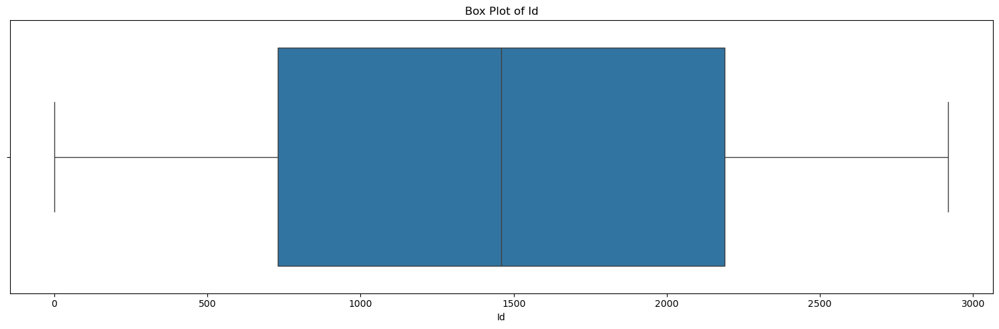

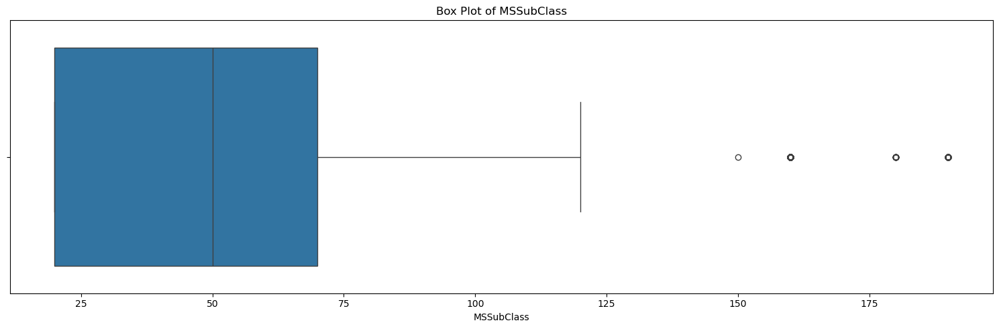

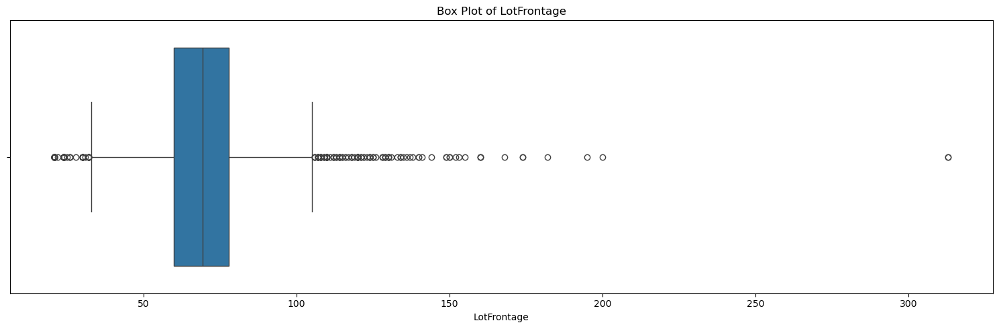

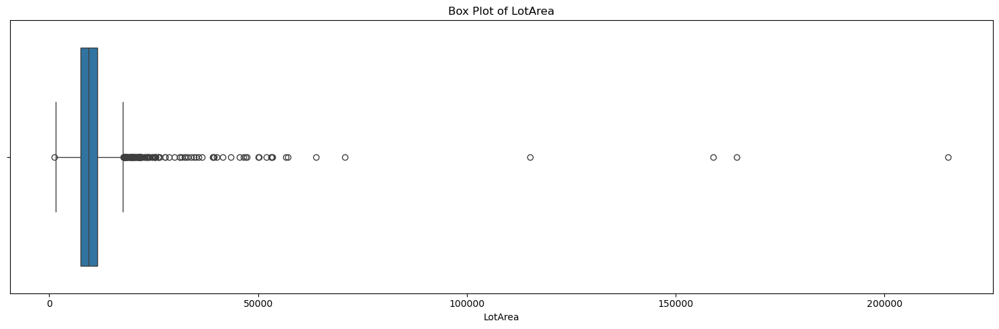

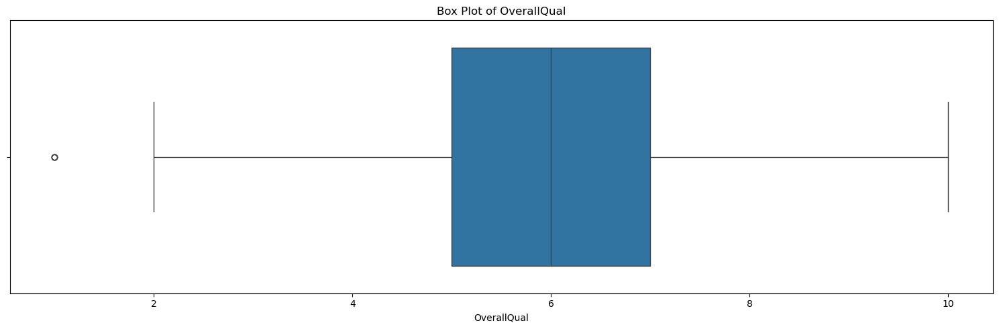

...

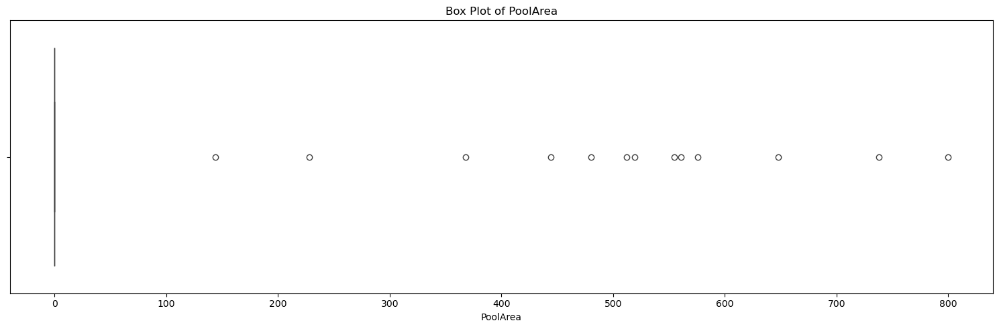

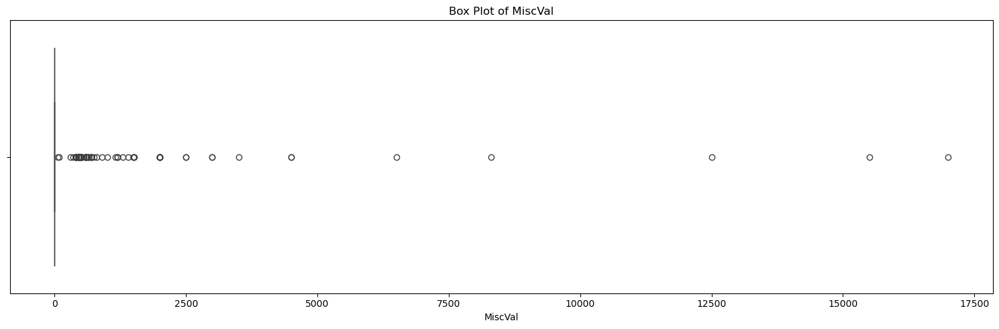

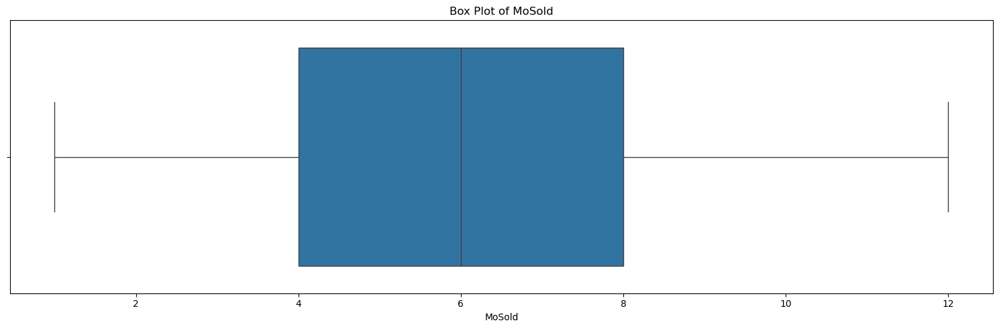

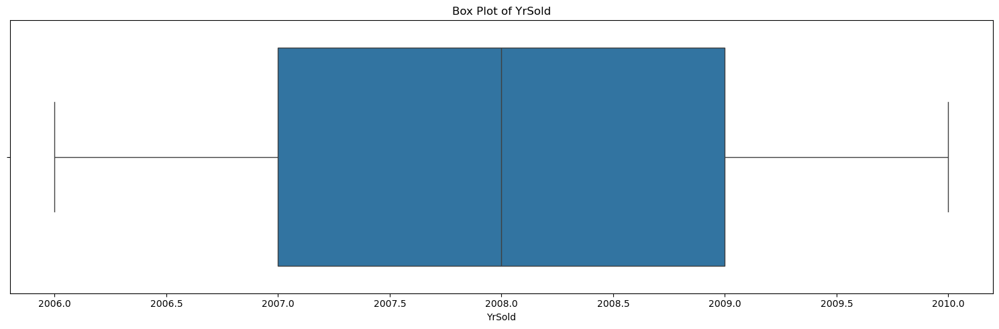

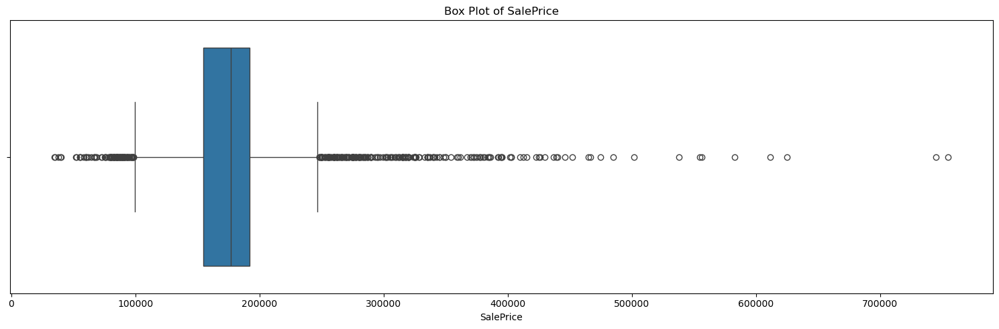

In [20]:
numerical_columns = df.select_dtypes(include=['number']).columns # stores the names of all numerical (i.e dtype int64 or float64) columns in the dataframe in a list.

num_columns_per_plot = 1 # plots one numerical (i.e dtype int64 or float64) on each box plot

# Sets up the matplotlib figure

for i in range(0, len(numerical_columns), num_columns_per_plot):
    plt.figure(figsize=(15, num_columns_per_plot * 5))  # adjusts the height based on the number of columns per plot
    subset_columns = numerical_columns[i:i + num_columns_per_plot] # extracts the subset of columns to be plotted in the current iteration

    # plots the box plot in the matplotlib figure
    
    for j, column in enumerate(subset_columns):
        plt.subplot(num_columns_per_plot, 1, j + 1) # adds a subplot to the figure for each columm
        sns.boxplot(data=df, x=column) # plots a box plot for the current columns
        plt.title(f'Box Plot of {column}') # sets the title of the plot
        plt.xlabel(column) # labels the x-axis with the column name

    plt.tight_layout() # adjusts the subplots parameters to give a claen layout
    plt.show() # displays the figure with box plots

##### Observation:

Box plots can highlight general outlier trends but may not capture all individual outliers. They summarize data distribution without specifying the exact values of extreme data points. To address this, Z-scores can be used to identify and handle outliers more precisely.

### Detect and Handle Ouliers Using Z-Score

In [23]:
def detect_and_handle_outliers(df, z_thresh=3):
    """
    Detects and handles outliers in a DataFrame using Z-scores.
    
    Parameters:
    - df: pd.DataFrame - DataFrame with numerical columns to process
    - z_thresh: float - Z-score threshold for identifying outliers (default is 3)
    
    Returns:
    - outlier_columns: list - List of column names that contain outliers
    - df: pd.DataFrame - DataFrame with outliers handled (capped to mean ± z_thresh * std)
    """
    outlier_columns = []
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

    for col in numeric_columns:
        # Calculate Z-scores for the column
        z_scores = zscore(df[col])
        
        # Detect outliers based on the Z-score threshold
        outliers = np.where(np.abs(z_scores) > z_thresh)[0]
        
        if len(outliers) > 0:
            outlier_columns.append(col)  # Store columns with outliers
            
            # Handle outliers by capping them to the mean ± z_thresh * std
            mean = df[col].mean()
            std = df[col].std()
            lower_bound = mean - (z_thresh * std)
            upper_bound = mean + (z_thresh * std)

            # Capping and flooring outliers to upper and lower bounds respectively
            df[col] = df[col].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)
    
    return outlier_columns, df # returns the list of columns with outliers and the new dataframe after handling the outliers


#### For Train Dataframe

In [25]:
# Get columns with outliers and the modified DataFrame
outlier_columns, cleaned_df = detect_and_handle_outliers(df)

print("Columns with outliers:", outlier_columns) # prints the list of columns with outliers

Columns with outliers: ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'SalePrice']


In [26]:
cleaned_df.head() # displays the first 5 rows of the dataframe

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60.0,RL,65.0,8450.0,Pave,Grvl,Reg,Lvl,AllPub,...,0.0,Ex,MnPrv,Shed,0.0,2,2008,WD,Normal,208500.0
1,2,20.0,RL,80.0,9600.0,Pave,Grvl,Reg,Lvl,AllPub,...,0.0,Ex,MnPrv,Shed,0.0,5,2007,WD,Normal,181500.0
2,3,60.0,RL,68.0,11250.0,Pave,Grvl,IR1,Lvl,AllPub,...,0.0,Ex,MnPrv,Shed,0.0,9,2008,WD,Normal,223500.0
3,4,70.0,RL,60.0,9550.0,Pave,Grvl,IR1,Lvl,AllPub,...,0.0,Ex,MnPrv,Shed,0.0,2,2006,WD,Abnorml,140000.0
4,5,60.0,RL,84.0,14260.0,Pave,Grvl,IR1,Lvl,AllPub,...,0.0,Ex,MnPrv,Shed,0.0,12,2008,WD,Normal,250000.0


In [27]:
cleaned_df.describe()  # describes the cleaned train dataframe to confirm if outliers have been handled

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,...,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000
mean,1460.000000,57.026765,68.995429,9880.646794,6.090249,5.566938,1971.318776,1984.264474,97.622694,438.143127,...,92.001769,46.044837,21.333722,0.971909,13.819408,0.486525,28.903261,6.213087,2007.792737,178496.535976
std,842.787043,42.176208,19.632779,4645.481459,1.406049,1.096063,30.272848,20.894344,158.245758,437.493370,...,118.823974,60.729613,55.037953,8.638130,45.632169,7.275384,180.470123,2.714762,1.314964,49756.328584
min,1.000000,20.000000,21.000000,1300.000000,1.859230,2.225185,1880.438454,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,730.500000,20.000000,60.000000,7478.000000,5.000000,5.000000,1953.500000,1965.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,154795.084150
50%,1460.000000,50.000000,69.305795,9453.000000,6.000000,5.000000,1973.000000,1993.000000,0.000000,369.000000,...,0.000000,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,176734.841500
75%,2189.500000,70.000000,78.000000,11570.000000,7.000000,6.000000,2001.000000,2004.000000,163.500000,733.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,191895.744150
max,2919.000000,184.690602,133.242832,33829.103157,10.000000,8.903969,2010.000000,2010.000000,638.079578,1808.021486,...,473.289600,250.213291,215.831058,78.166769,184.615445,109.243636,1753.032599,12.000000,2010.000000,352197.551810


### Checking for Skewness

In [29]:
def detect_skewed_columns(df, skew_threshold=0.5):
    """
    Identifies columns in the DataFrame with significant skewness.

    Parameters:
    - df (pd.DataFrame): The DataFrame to analyze.
    - skew_threshold (float): The threshold for skewness to consider a column as significantly skewed. Default is 0.5.

    Returns:
    - dict: A dictionary where the keys are the names of the skewed columns, and the values are their skewness values.
    """
    skewed_columns = {}
    
    # Iterate through each numeric column in the DataFrame
    for col in df.select_dtypes(include=['float64', 'int64']).columns:
        skewness = df[col].skew()  # Calculate skewness of the column
        
        # If the absolute value of skewness is greater than the threshold, store the column name and its skewness
        if abs(skewness) > skew_threshold:
            skewed_columns[col] = skewness
    
    return skewed_columns


In [30]:
# skewed_columns = detect_skewed_columns(cleaned_df) # calls the "detect_skewed_columns" function on the outlier free df

# print(f"""
# Columns with significant skewness: 

# {skewed_columns}

# Count:

# {len(skewed_columns)}""") # prints the name of the columns with skewness and their respective values (i.e the extent to which they're skewed)


### Visualizing the Skewness Using Seaborn

In [32]:
def visualize_skewness(df, skew_threshold=0.5):
    """
    Visualizes the distribution of columns with significant skewness in the DataFrame.

    Parameters:
    - df (pd.DataFrame): The DataFrame to analyze.
    - skew_threshold (float): The threshold for skewness to visualize. Default is 0.5.

    Prints:
    - Information about columns with significant skewness.
    - Plots the distribution of each skewed column.

    Returns:
    - None
    """
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    
    # Iterate through each numeric column
    for col in numeric_columns:
        skewness = df[col].skew()  # Calculate skewness of the column
        
        # Check if the absolute skewness is greater than the threshold
        if abs(skewness) > skew_threshold:
            print(f"Column: {col}, Skewness: {skewness}")
            
            # Create a distribution plot for the column
            sns.displot(df[col], kde=True, height=5, aspect=2)
            plt.title(f'Distribution of {col} (Skewness: {skewness:.2f})')
            plt.show()


In [33]:
# # visualizes skewness for columns in the dataframe with skewness above the threshold (0.5 by default)
# visualize_skewness(cleaned_df)


### Handling the Skewness Using Box-Cox Transformation

In [35]:
def handle_skewness_boxcox(df, skew_threshold=0.5):
    """
    Handles skewness in the DataFrame by applying Box-Cox transformation to columns with significant skewness.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data to be transformed.
    - skew_threshold (float): The threshold for skewness to apply transformation. Default is 0.5.

    Returns:
    - tuple: A tuple containing:
        - A dictionary with column names and their skewness values for columns with significant skewness.
        - A dictionary with column names and the lambda values used for the Box-Cox transformation.
        - The DataFrame with skewed columns transformed.
    """
    skewed_columns = {}
    transformed_columns = {}

    # Iterate through each numeric column in the DataFrame
    for col in df.select_dtypes(include=['float64', 'int64']).columns:
        skewness = df[col].skew()  # Calculate skewness of the column

        # Check if the absolute skewness is greater than the threshold and column has positive values
        if abs(skewness) > skew_threshold and (df[col] > 0).all():
            skewed_columns[col] = skewness  # Store skewness value for reporting
            
            # Apply Box-Cox transformation to reduce skewness
            transformed_data, lambda_value = boxcox(df[col])
            transformed_columns[col] = lambda_value  # Store the lambda for each transformed column
            
            # Replace the original column with the transformed data
            df[col] = transformed_data

    return skewed_columns, transformed_columns, df

In [36]:
# # calls the "handle_skewness_boxcox" function on the outlier free df to handle skewness for columns with skewness above the threshold (0.5 by default)
# skewed_columns, transformed_columns, transformed_df = handle_skewness_boxcox(cleaned_df) 


# # prints the skewed columns and the lambda values used for transformation

# print(f"""
# Columns with significant skewness and their skewness values: 

# {skewed_columns}

# Count: 

# {len(skewed_columns)}
# """)


# transformed_df.head() # displays first 5 rows of the train dataframe with skewness handled


### Verifying Skewness Handling

In [38]:
def visualize_columns(df, columns, title_suffix=''):
    """
    Visualizes the distribution of specified columns in the DataFrame.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.
    - columns (list of str): List of column names to visualize.
    - title_suffix (str): Optional suffix to add to the title of the plot.
    """
    for col in columns:
        plt.figure(figsize=(10, 6))
        sns.histplot(df[col], kde=True)
        plt.title(f'Distribution of {col} {title_suffix}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.show()



#### For Train Dataframe

In [40]:
# # gets the names of columns where skewness was handled
# transformed_columns = list(skewed_columns.keys()) ## -- look in here if you encounter any errors

# # visualizes the columns where skewness was handled
# print("Skewness Handled Visualization:")
# visualize_columns(cleaned_df, transformed_columns, title_suffix='(After Handling Skewness)')


### Data Encoding
To  encode non-numerical columns in the DataFrame, label encoding will be employed. This technique converts categorical values into numeric labels, allowing the algorithm to process them effectively. 

#### For Train Dataframe

In [43]:
# iterates through each categorical column in the dataframe
for col in cleaned_df.select_dtypes(include=['object']).columns:
    encoder = LabelEncoder() # initialize label encoder
    encoded_data = encoder.fit_transform(cleaned_df[col]) # encodes categorical values to label encoder
    cleaned_df[col] = encoded_data # replaces the original column with encoded data

cleaned_df.head() # displays first 5 rows of encoded dataframe

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60.0,3,65.0,8450.0,1,0,3,3,0,...,0.0,0,2,2,0.0,2,2008,8,4,208500.0
1,2,20.0,3,80.0,9600.0,1,0,3,3,0,...,0.0,0,2,2,0.0,5,2007,8,4,181500.0
2,3,60.0,3,68.0,11250.0,1,0,0,3,0,...,0.0,0,2,2,0.0,9,2008,8,4,223500.0
3,4,70.0,3,60.0,9550.0,1,0,0,3,0,...,0.0,0,2,2,0.0,2,2006,8,0,140000.0
4,5,60.0,3,84.0,14260.0,1,0,0,3,0,...,0.0,0,2,2,0.0,12,2008,8,4,250000.0


### Feature Relationships
This section utilizes a correlation matrix to display the relationships between various features in the DataFrame(s). A correlation matrix is a table of correlation coefficients between variables, with values ranging from -1 to 1. It helps identify the strength and direction of relationships between features, where positive values indicate a direct relationship and negative values suggest an inverse relationship. This analysis provides insights into feature dependencies or redundancies in the dataset.

**Note:** The strength of the correlation can be interpreted as follows: stronger correlations are represented by values closer to 1 or -1, often shown in deeper green for positive correlations and deeper red for negative correlations. Weaker correlations, closer to 0, are represented by lighter colors.

#### Correlation Matrix Heatmap with Matplotlib for Train Dataframe

In [46]:

plt.figure(figsize = (100, 150)) # specifies the dimension of the correlation matrix heatmap

correlation_plot = sns.heatmap(cleaned_df.corr().round(2), annot=True, cmap='RdYlGn', center=0, square=True) # plots the correlation matrix as a heatmap for train dataset
correlation_plot.set_title("Correlation Heat Map for the Train Dataframe")

Text(0.5, 1.0, 'Correlation Heat Map for the Train Dataframe')

### Feature (i.e Predictor) and Target Definition
In this analysis, the **features** (or predictors) represent the independent variables that are used to predict the **target** variable. These features include attributes like `LotArea`, `YearBuilt`, `GrLivArea`, and `OverallCond`, which describe various characteristics of the property, such as lot size, year of construction, and the overall condition. These predictors help build the model that estimates the house's value.

The **target variable** is the dependent variable, in this case, the `SalePrice` column, which represents the final price of a house. The goal of the analysis is to understand how the features influence the target, i.e., how each feature contributes to predicting the sale price of the property.

In [48]:
X = cleaned_df.drop(["Id",'SalePrice','Electrical', 'LandSlope', 'GarageQual', 'GarageCond', 'PavedDrive', 'Condition1', 'OpenPorchSF', 'EnclosedPorch', 'Neighborhood', 'PoolArea', '1stFlrSF', 'LotConfig', 'Fence', 'MiscFeature', 'MiscVal', 'Utilities', 'Alley', 'Street', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'GarageYrBlt', '2ndFlrSF', 'CentralAir', 'BsmtUnfSF', 'BsmtFullBath', 'BsmtHalfBath', 'BsmtFinSF2', 'HalfBath', 'BsmtFinType2', 'BsmtFinType1', 'BsmtCond', 'ExterCond', 'MasVnrArea', 'Exterior2nd', 'FireplaceQu', 'GarageType', 'SaleCondition'], axis =1) # excluding 'Id' and 'SalePrice' to create the feature set (independent variables).
Y = cleaned_df["SalePrice"] # extracting 'SalePrice' as the target variable (dependent variable).


**Observation:** 
After initially training the regression model, it was observed that the following feature columns had little to no importance for predicting the final sale price:

- 'Electrical', 'LandSlope', 'GarageQual', 'GarageCond', 'PavedDrive', 'Condition1', 'OpenPorchSF', 'EnclosedPorch', 'Neighborhood', 'PoolArea', '1stFlrSF', 'LotConfig', 'Fence', 'MiscFeature', 'MiscVal', 'Utilities', 'Alley', 'Street', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'GarageYrBlt', '2ndFlrSF', 'CentralAir', 'BsmtUnfSF', 'BsmtFullBath', 'BsmtHalfBath', 'BsmtFinSF2', 'HalfBath', 'BsmtFinType2', 'BsmtFinType1', 'BsmtCond', 'ExterCond', 'MasVnrArea', 'Exterior2nd', 'FireplaceQu', 'GarageType', 'SaleCondition'

These columns had importance values of zero (i.e., coefficients of 0). To avoid negatively impacting the model's performance, these features were excluded from the final model.

This adjustment resulted in a noticeable improvement in performance metrics, including:

- **Mean Squared Error (MSE)**
- **Root Mean Squared Error (RMSE)**
- **R² Score**

By removing irrelevant features, the model became more efficient and produced more accurate predictions.
.

### Train-Test Split
To further split the pre-separated train and test data into feature sets (X) and target variables (Y), the following steps are taken:

1. **X_train and X_test**: Extract feature columns from the training and testing datasets to create the training and testing feature sets, enabling the model to learn and evaluate on the respective features.
2. **Y_train and Y_test**: Extract the target variable (e.g., sales price) from both datasets to align the features with their corresponding target values.

This separation is crucial for training the model on known data (X_train, Y_train) and evaluating its performance on unseen data (X_test, Y_test), ensuring a robust assessment of the model’s predictive capability.

In [51]:
# splits the data

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

X_train = X_train.values # converts X_train to a numpy array
Y_train = Y_train.values # converts Y_train to a numpy array
X_test = X_test.values # converts X_test to a numpy array
Y_test = Y_test.values # converts Y_test to a numpy array

print(X_train.shape, Y_train.shape) # prints the shape of X_train and Y_train numpy arrays
print(X_test.shape, Y_test.shape) # prints the shape of X_test and Y_test numpy arrays

(2335, 41) (2335,)
(584, 41) (584,)


### Feature Scaling
This section standardizes the features to a common scale, which enhances the model's performance and numerical stability. This is crucial when features have different units or ranges, ensuring that the model treats all features equally and improves the efficiency of algorithms that are sensitive to feature scaling.

In [53]:
scaler = StandardScaler() # initializes the scaler
X_train_scaled  = scaler.fit_transform(X_train) # fits the scaler on the train data and transform it
X_test_scaled = scaler.transform(X_test) # transforms the test data using the same scaler (i.e does not fit again)
print(X_train_scaled)

[[ 2.43543754 -0.05157893 -2.2945788  ...  0.28100443 -1.35434194
   0.32286988]
 [-0.8826672  -3.13970216  0.31369787 ... -0.08865492  0.92403589
   0.32286988]
 [ 0.06536272 -0.05157893  0.56941127 ... -0.08865492  1.68349517
   0.32286988]
 ...
 [-0.17164476 -0.05157893 -0.19772893 ...  2.12930115  0.92403589
   0.32286988]
 [-0.8826672  -0.05157893 -0.45344233 ... -0.82797361 -1.35434194
   0.32286988]
 [-0.17164476 -0.05157893 -0.70915572 ... -0.08865492 -0.59488266
   0.32286988]]


### Regression Analysis


The next step involves performinr Regressioa Analysis using Linear Regression. This technique models the relationship between a dependent variable and one or more independent variables, aiming to fit a linear equation to the data. For predicting `SalePrice`, Linear Regression identifies how different features influence the target variable, enabling accurate and meaningful predictions. This analysis is crucial for understanding feature impacts and making informed decisions in real estate valuations or similar applications.s.

#### Scattered Plot to Show the Relationship of Each Feature with the Target Variable

In [56]:
# Number of features
X_trn = cleaned_df.drop(["Id","SalePrice"], axis =1) # excluding 'Id' and 'SalePrice' to create the feature set (independent variables).
Y_trn = cleaned_df["SalePrice"] # extracting 'SalePrice' as the target variable (dependent variable).
num_features = X_trn.shape[1]

# Set up the figure and axes
plt.figure(figsize=(15, 5 * num_features))

# Loop through each feature
for i, feature in enumerate(X_trn.columns):
    plt.subplot(num_features, 1, i + 1)
    plt.scatter(X_trn[feature], Y_trn, color='blue', alpha=0.5)
    plt.title(f'Relationship between {feature} and SalePrice')
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.grid(True)

plt.tight_layout()
plt.show()


#### Class Definition for My Custom Built Linear Regressor

In [58]:
class LinearRegressionModel:
    
    def __init__(self, learning_rate = 0.001, epochs=1000):

        # initializes the hyper-parameters
        self.learning_rate =  learning_rate  
        self.epochs = epochs # the number of iterations for the training
        self.weights = None # sets the weight value to nothing intially
        self.bias = None # sets the bias value to nothing initially
    
    # -- method for training
    def training(self, X, Y):

        samples, features = X.shape # uses the shape of X matrix to get the number of features and samples

        self.weights = np.zeros(features) # creates a weight matrix of zeros using numpy depending on the number of features in the X matrix
        self.bias = 0 # sets the bias to zero.

        # for loop to run the training for 1000 times (as specified by the number of epochs earlier)
        for epoch in range(self.epochs):
            
            # performs prediction using numpy arrays
            
            Y_prediction = np.dot(X, self.weights) + self.bias
            # NOTE: We are computing the Y_prediction here to enable us update the weights and bias
            
            # calculating the weight and bias gradients (to help us update the weights and calculate the cost function)
    
            dw = (1/samples) * np.dot(X.T, (Y_prediction - Y)) # calculates the derivative of the weights. The dot function automatically does the sum for us, no need to add sum there
            db = (1/samples) * np.sum((Y_prediction - Y)) # calculates the derivative of the bias
    
            # updating the weights and bias
    
            self.weights -= (self.learning_rate * dw) # updates the weights
            self.bias -= (self.learning_rate * db) # updates the bias

        # print(Y_prediction)
    # -- method for predicting
    def predict(self, X):
        
        # performs prediction on a separate dataset
        Y_prediction = np.dot(X, self.weights) + self.bias
        return Y_prediction    
    
    

#### Linear Regression with My Custom Built Model

In [60]:
regressor = LinearRegressionModel(learning_rate = 0.01, epochs = 1000) # initializes the custom linear regression model
regressor.training(X_train_scaled, Y_train) # intiates the training process
predictions = regressor.predict(X_test_scaled) # performs the predictions

In [61]:
print(predictions) # displays predicted prices

[155242.53438686 209590.29250264 135608.72241758 213988.36771604
 198818.39140178 252278.04223959 116013.96252562 199610.35931245
 144135.16867313 177450.01207048 157830.31706558 219010.15144605
 169118.74814432 154082.2748196  177933.85098529 189058.51518449
 148318.55861287 198286.02294333 146511.1565225  173826.15962015
 226634.48844675 124665.21581266 123002.21485371 202238.96808917
 186013.94313471 181831.90690635 223707.94680202 119816.01549757
 235579.280422   195407.55372427 232933.60102195 137906.44914834
 204133.69685703 178577.8651459  208321.6066926  186127.9867778
 168509.75882959 168842.77270211 134861.14038916 146956.66600329
 166975.19338858 220127.75375893 211417.48442418 226819.86131455
 152546.24276704 186458.65813055 176333.49656465 226150.44062992
 169023.08554973 204835.5715606  170819.0565151  133955.73054185
 142103.21678882 176284.37233188 212927.4305963  123499.13274058
 157033.68833032 255728.83868533 207021.36827177 139337.86643552
 156983.98733108 141771.25

### Model Evaluation Metrics
The following evaluation metrics will be used to properly assess the model's performances:

#### 1. **Mean Squared Error (MSE)**
   - **Definition**: MSE measures the average of the squared differences between the predicted and actual values. A lower MSE indicates a better fit.
   - **Formula**:
     $$
     \text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2
     $$
   - **Where**:
     - $n$ = number of data points
     - $y_i$ = actual value for the $i^{\text{th}}$ observation
     - $\hat{y}_i$ = predicted value for the $i^{\text{th}}$ observation

#### 2. **Root Mean Squared Error (RMSE)**
   - **Definition**: RMSE is the square root of MSE and gives an idea of the average distance between predicted and actual values in the same units as the output.
   - **Formula**:
     $$
     \text{RMSE} = \sqrt{\text{MSE}} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}
     $$
   - **Where**:
     - $n$ = number of data points
     - $y_i$ = actual value for the $i^{\text{th}}$ observation
     - $\hat{y}_i$ = predicted value for the $i^{\text{th}}$ observation

#### 3. **R² Score (Coefficient of Determination)**
   - **Definition**: The R² score represents the proportion of variance in the dependent variable that is predictable from the independent variables. An R² score closer to 1 indicates a better fit, while a score less than 0 suggests a poor fit.
   - **Formula**:
     $$
     R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}
     $$
   - **Where**:
     - $y_i$ = actual value for the $i^{\text{th}}$ observation
     - $\hat{y}_i$ = predicted value for the $i^{\text{th}}$ observation
     - $\bar{y}$ = mean of actual values
t( y_i -
hat{y_i} \) = predicted value


#### Evaluation Metrics For My Custom Built Model

In [64]:
def mean_sqrd_error(Y_test, predictions):
    """
    Calculates the Mean Squared Error (MSE) between the actual and predicted values.

    Mean Squared Error (MSE) is a common evaluation metric for regression models that measures the average squared difference 
    between the actual values and the predicted values. It quantifies the average magnitude of the errors in the model's predictions,
    with larger errors being penalized more heavily due to the squaring.

    Parameters:
    - Y_test (numpy array or list): The actual values for the test data. This represents the true values of the dependent variable.
    - predictions (numpy array or list): The predicted values generated by the regression model. These are the model's estimates of the dependent variable.

    Returns:
    - mse (float): The Mean Squared Error between the actual and predicted values.
    """
    mse = np.mean((Y_test - predictions) ** 2)
    return mse


In [65]:
mse = mean_sqrd_error(Y_test, predictions) # calls the "mean_sqed_error" function andcomputes the mean squared error
print(f"Mean Squared Error: {mse}") # displays the mean squared error

Mean Squared Error: 1366620309.746988


In [66]:
rmse = np.sqrt(mse) # computes the root mean squared eror
print(f"Root Mean Squared Error with best alpha: {rmse}") # displays the root mean squared error

Root Mean Squared Error with best alpha: 36967.828036645435


In [67]:
r2 = r2_score(Y_test, predictions) # computes the coefficient of determination
print(f'R2 Score: {r2}') # displays the coefficient of determination

R2 Score: 0.5009811750269637


#### Scattered Plot to Visualize Best Fit Line

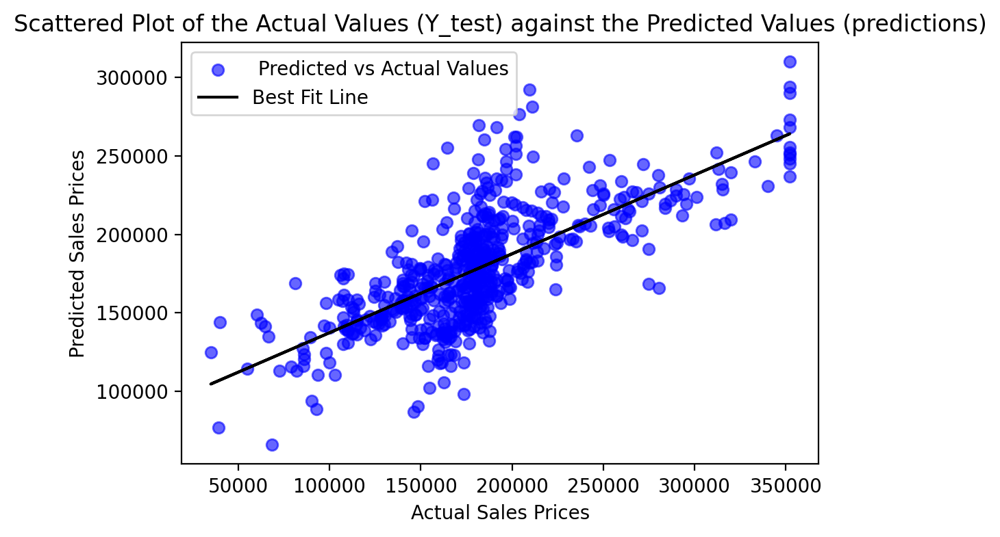

In [69]:
slope, intercept = np.polyfit(Y_test, predictions, 1) # computes the slope and intercept
line = slope * np.array(Y_test) + intercept 

plt.figure(figsize=(6, 4), dpi=200) # specifies the plot size
plt.scatter(
    Y_test, # the actual values
    predictions, # the predicted values
    c="blue", # color of the data points
    alpha=0.6, 
    label=" Predicted vs Actual Values" # legend 
) # plots a scattered plot

plt.plot(Y_test, line, color="black", label="Best Fit Line") # plots the best fit line
plt.title("Scattered Plot of the Actual Values (Y_test) against the Predicted Values (predictions)") # specifies the title of the plot
plt.xlabel("Actual Sales Prices") # 
plt.ylabel("Predicted Sales Prices")
plt.legend() # plots the legend
plt.show() # displays the plot


#### Linear Regression Using Sklearn's Regressor

In [71]:
# regressor = LinearRegression() # intializes sklearn's linear regression  model
# regressor.fit(X_train_scaled, Y_train) # initiates the training process
# predictions = regressor.predict(X_test_scaled) # performs the predictions


In [72]:
# print(predictions)

In [73]:
# mse = mean_squared_error(Y_test, predictions)
# print(mse)

In [74]:
# r2 = r2_score(Y_test, predictions)
# print(f'R2 Score with best alpha: {r2}')

### Hyper-parameter Tuning:
I used `Lasso` regression with `GridSearchCV` to find the optimal value of the regularization parameter, alpha. Hyper-parameter tuning helps improve model performance by selecting the best parameters that minimize the error. The Lasso regression formula adds an L1 penalty to the linear regression cost function, which helps with feature selection by shrinking less important coefficients to zero.

**Lasso Formula:**

$$
\min_{w} \left( \frac{1}{2n} \sum_{i=1}^{n} \left( y_i - X_i w \right)^2 + \alpha \sum_{j=1}^{p} |w_j| \right)
$$

**Where:**
- $n$ = number of data points
- $y_i$ = actual value
- $X_i$ = feature matrix
- $w_j$ = model coefficients
- $\alpha$ = regularization parameter
ion parameter
meter
tion parameter


#### Applying Lasso Regressor with GridSearch

In [77]:
# Define the parameter grid for alpha
param_grid = {'alpha': [0.01, 0.1, 1, 10, 100, 1000]}

# Create a Lasso regression model
lasso = Lasso(max_iter=10000)

# Use GridSearchCV to find the best alpha with MSE scoring
grid_search = GridSearchCV(lasso, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, Y_train)

# Best alpha from grid search
best_alpha = grid_search.best_params_['alpha']
print(f"Best alpha: {best_alpha}")

# Fit the model with the best alpha
lasso_best = Lasso(alpha=best_alpha)
lasso_best.fit(X_train_scaled, Y_train)

# Make predictions with the best model
predictions = lasso_best.predict(X_test_scaled)
print(f"Predictions: {predictions}")



Best alpha: 100
Predictions: [154065.47625289 208704.0884707  136235.62036776 213536.77567269
 198934.0293132  249637.47539939 116420.52840797 201171.27881062
 143552.12642552 177117.30542665 158658.99538281 218904.65363924
 168922.10144192 154951.77107383 176714.35161114 189466.44095308
 148903.07405848 197951.49622748 146764.64034024 174809.66920176
 226638.48793452 124480.25220631 123739.32032119 202890.62747414
 186075.55603381 181718.96003669 225145.70763148 120521.28103441
 235483.43678715 195721.46165143 232070.8950799  138665.26649489
 204392.85041647 177892.8107185  207951.02958263 186173.73740047
 168259.92646547 168019.24361875 136092.79807745 145699.31408366
 165929.7054625  219552.39934794 211242.66059431 228345.02636439
 153087.88951156 185712.10034462 176084.32584257 226989.31977824
 168382.63188065 205024.65697805 170877.28463192 134626.29105642
 142091.56746262 176443.11891905 217241.90990198 123367.36026047
 156901.51990248 256313.52780103 209504.340302   139973.37945

#### Evaluation Metrics For Lasso Regressor Model

In [79]:
# Evaluate the model with the best alpha using normal MSE
mse_best = mean_squared_error(Y_test, predictions)
print(f"Mean Squared Error with best alpha: {mse_best}")

# Evalue the model with the best alpha using the RMSE
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error with best alpha: {rmse}")

# Evaluate the model with the best alpha using r2_score
r2 = r2_score(Y_test, predictions)
print(f'R2 Score with best alpha: {r2}')

Mean Squared Error with best alpha: 1356030735.135521
Root Mean Squared Error with best alpha: 36967.828036645435
R2 Score with best alpha: 0.5048479381958478


In [80]:
print(f""" 
Y_test Values:
{Y_test}, 

Predictions: 
{predictions}"""

)

 
Y_test Values:
[180096.9312     192686.9317     158151.985      187500.
 172023.6778     311872.         154034.9174     260000.
 185998.2552     181613.0351     176515.4975     201691.2083
 176487.9432     177548.1405     149900.         207500.
 128500.         189000.         128000.         180116.7526
 268000.          34900.         168175.9113     271000.
 224323.7105     180258.1312     301000.         159270.5378
 228156.3728     151400.         185733.534      165625.1277
 194542.5441     180000.         186599.2213     176270.4531
 143000.         181871.5988     166274.9005     107500.
 188000.8247     199792.3027     260000.         223055.5887
 140000.         184187.1588     208900.         250000.
 125000.         256000.         191435.0079     149000.
 114500.         202665.         186818.6108      86000.
 178891.5545     352197.55181013 316600.         110000.
 173986.6351     171411.4045     149500.         110000.
 152084.7724     180008.1885     159355.7101   

#### Scattered Plot to Visualize Best Fit Line

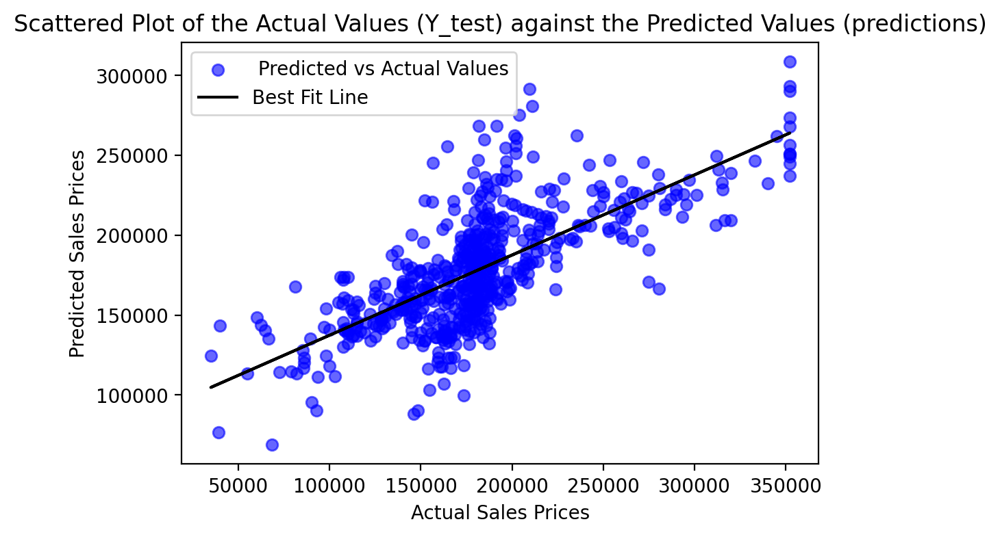

In [82]:

slope, intercept = np.polyfit(Y_test, predictions, 1) # computes the slope and intercept
line = slope * np.array(Y_test) + intercept 

plt.figure(figsize=(6, 4), dpi=200) # specifies the plot size
plt.scatter(
    Y_test, # the actual values
    predictions, # the predicted values
    c="blue", # color of the data points
    alpha=0.6, 
    label=" Predicted vs Actual Values" # legend 
) # plots a scattered plot

plt.plot(Y_test, line, color="black", label="Best Fit Line") # plots the best fit line
plt.title("Scattered Plot of the Actual Values (Y_test) against the Predicted Values (predictions)") # specifies the title of the plot
plt.xlabel("Actual Sales Prices") # 
plt.ylabel("Predicted Sales Prices")
plt.legend() # plots the legend
plt.show() # displays the plot


### Feature Importances
Feature importance values help identify which features contribute the most to the model’s predictions. Understanding feature importance allows for better model interpretation, highlights key drivers of outcomes, and aids in feature selection by removing less significant variables, thereby improving model performance and reducing complexity.


In [84]:
coefficients = lasso_best.coef_

# Replace these with your actual feature names
feature_names = X.columns # gets the name of each feature column in the dataframe

# creates the DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names, # uses a python dictionary to create a column with key "Feature" and value "feature_name" (i.e the names of each feature)
    'Importance': coefficients # uses a python dictionary to create a column with key "Importance" and value "coefficient" (i.e importance values)
})


importance_df['Absolute Importance'] = np.abs(importance_df['Importance']) # creates a new columns "Absolute Importance" that stores the absolute value of the Importance values
importance_df = importance_df.sort_values(by='Absolute Importance', ascending=False) # sorts the DataFrame by the absolute value of importance to visualize more easily

# filters out features with importance values that are zero or less
# zero_features_Importance = importance_df[importance_df['Importance'] == 0]['Feature'].tolist()

# print(zero_features_Importance)

importance_df # displays the dataframe


,Feature,Importance,Absolute Importance
23,GrLivArea,10277.970005,10277.970005
3,LotArea,7667.402639,7667.402639
8,OverallQual,5786.111647,5786.111647
28,TotRmsAbvGrd,5712.696945,5712.696945
9,OverallCond,3654.432719,3654.432719
26,KitchenAbvGr,-3317.878763,3317.878763
16,BsmtQual,-3137.874433,3137.874433
38,MoSold,3075.729905,3075.729905
19,TotalBsmtSF,2782.980570,2782.980570
33,GarageArea,2420.924605,2420.924605


##### The Importance Plot

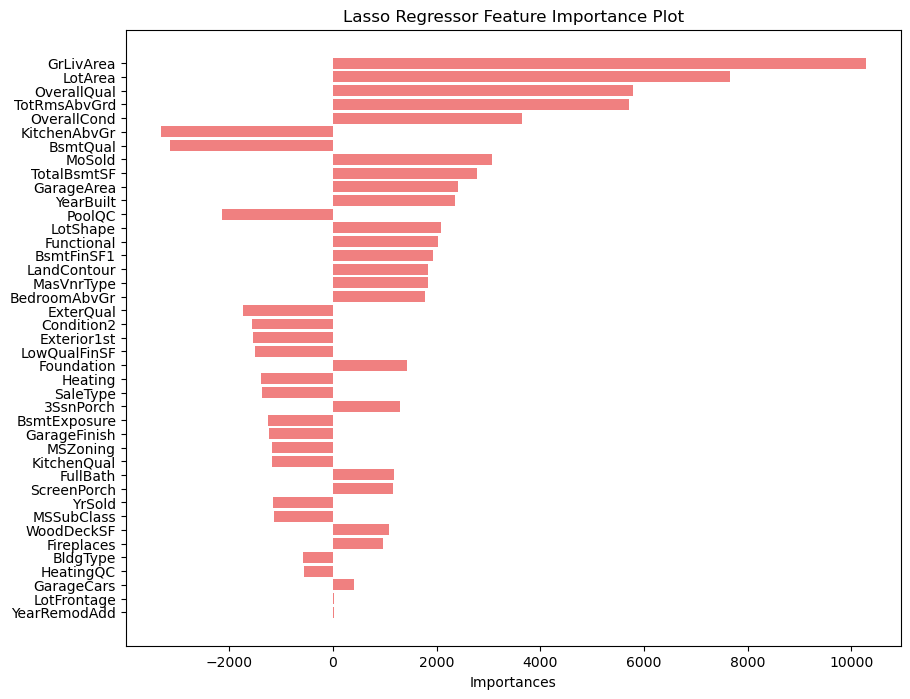

In [86]:
coefficients = lasso_best.coef_
feature_names = X.columns # gets the feature names for each column in X

# creates a dataFrame for better handling and sorting
coefficients_df = pd.DataFrame({
    'Feature': feature_names,
    'Importances': coefficients
})

# sorts the dataFrame by absolute value of coefficient in descending order
coefficients_df['Absolute Importances'] = np.abs(coefficients_df['Importances'])
coefficients_df = coefficients_df.sort_values(by='Absolute Importances', ascending=False)

# Plot
plt.figure(figsize=(10, 8))
plt.barh(coefficients_df['Feature'], coefficients_df['Importances'], color='lightcoral')
plt.xlabel('Importances')
plt.title('Lasso Regressor Feature Importance Plot')
plt.gca().invert_yaxis()  #  displays the features with the highest coefficients at the top
plt.show()


### Model Deployment
With a satisfory model performance, the model will be savedt for future use. This can be done using libraries like `joblib` or `pickle`, which allowusu to serialize the model and load it later for deployment without retraining.

In [88]:
joblib.dump(lasso_best, 'Rizama_Victor_Samuel_Linear_Regression_Assignment (Single Dataset).pkl') # saves the model in the current code workingn directory

['Rizama_Victor_Samuel_Linear_Regression_Assignment (Single Dataset).pkl']